[В данном проекте я анализирую рынок общественного питания Москвы] 

[План]

[Первая часть](#start)
* [Я импортировал библиотеки](#importlib)
* [Открыл файл с датасетом](#opendata) 
* [Изучил общую информацию](#info) 
* [Изучил пропуски](#null)
* [Изучил дубоикаты](#dubl)

[Вторая часть](#secondpart) 

* [Я провел предобработку данных](#prepocessing) 
* [Создал столбцы с новыми данными](#newdata) 

[Третья часть](#thirdpart) 

* [Я занимался анализом данных московского рынка общепита](#moscowmarketanalysis) 
* [Исследовал представленные категории в датасете](#researchcat) 
* [Я визуализировал представленные категории в датасете](#researchcatvisual)
* [Количество посадочных мест в заведениях общепита](#seats)
* [Я визуализировал  количество посадочных мест в заведениях общепита](#seatsvisual)
* [Рассмотрел и соотнес количество сетевых и несетевых заведений](#webandnotweb)
* [Я визуализировал соотношение количества сетевых и несетевых заведений](#webandnotwebvisual) 
* [Выявил, какие категории чаще всего являются сетевыми и несетевыми](#topweb)
* [Выпел топ-15 популярных сетей в Москве и посмотрел на их процентное соотношение](#top15web) 
* [Выпел топ-15 популярных сетей в Москве и построил стобчатый график](#top15webstolp) 
* [Оценил количество заведений и категорий по районам](#catbydistrct)  
* [Визуализировал рейтинги заведений общепита](#raitingeat) 
* [Построил фоновую картограмму (хороплет) со средним рейтингом заведений каждого района](#mapmeadleraiting)
* [Отобразил все заведения датасета на карте с помощью кластеров](#mapclaster) 
* [Нашел топ-15 улиц по количеству заведений](#top15streats) 
* [Нашел улицы, на которых находится только одно заведение и описал особенности этих заведений](#cafebystreat)
* [Посчитал медиану среднего чека для каждого района и отобразил данные на карте](#medianbyavg) 

[Четвертая часть](#Forthpart)

* [Исследовал количество кафе в датасете](#cafedata) 
* [Нашел круглосуточные кафе и отобразил их на карте](#cafefulltime) 
* [Нашел рейтинги кафе и отобразил их на карте](#cafraiting) 
* [Выявил примерную стоимость капучино, на которую нужно ориентироваться при открытии кафе](#meadlcup) 

[Выводы](#results)

[Презентация](#presentation)


Первая часть 
<a id="start"></a> 

Я импортировал библиотеки 
<a id="importlib"></a> 

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import numpy as np
from plotly import graph_objects as go
import folium
import json
from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster



Я открыл файл с датасетом 
<a id="opendata"></a> 

In [2]:
data = pd.read_csv('/datasets/moscow_places.csv', sep = ',')

with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)


Я изучил общую информацию 
<a id="info"></a> 

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Я изучил пропуски. Пропусков достаточно много, но я решил их оставить, потому что в дальнейшем это может привести к искажению данных
<a id="null"></a> 

In [4]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Я изучил дубликаты в разных столбцах. В данном случае дублируются названия некоторых сетевых кафе, категорий, адресов. Их удаление может привести к искажению данных
<a id="dubl"></a> 

In [5]:
data['address'].duplicated().sum()

2653

In [6]:
data.duplicated(subset=['address'], keep=False)


0        True
1       False
2       False
3       False
4        True
        ...  
8401     True
8402     True
8403     True
8404     True
8405     True
Length: 8406, dtype: bool

число повторяющихся строчек (дубликатов) в столбце adress - 2653

In [7]:
len(data['address'])- len(data['address']. drop_duplicates ())

2653

In [8]:
data.duplicated(subset=['name'], keep=False)

0       False
1       False
2       False
3       False
4        True
        ...  
8401    False
8402    False
8403    False
8404     True
8405    False
Length: 8406, dtype: bool

число повторяющихся строчек (дубликатов) в name adress - 2792

In [9]:
len(data['name'])- len(data['name']. drop_duplicates ())

2792

In [10]:
data['address'].value_counts().head(20)

Москва, проспект Вернадского, 86В           28
Москва, Усачёва улица, 26                   26
Москва, Ярцевская улица, 19                 20
Москва, площадь Киевского Вокзала, 2        20
Москва, Пресненская набережная, 2           16
Москва, Щёлковское шоссе, вл75              16
Москва, Каширское шоссе, 61Г                16
Москва, Хорошёвское шоссе, 27               16
Москва, Лесная улица, 20, стр. 3            16
Москва, проспект Мира, 211к2                16
Москва, улица Авиаконструктора Миля, 3А     15
Москва, проспект Мира, 211, корп. 2         15
Москва, Профсоюзная улица, 56               15
Москва, улица Вавилова, 3                   14
Москва, улица Вавилова, 64/1с1              14
Москва, Мытная улица, 74                    14
Москва, проспект Вернадского, 86А           12
Москва, Варшавское шоссе, 140               11
Москва, Поречная улица, 10                  11
Москва, Верхняя Красносельская улица, 3А    11
Name: address, dtype: int64

Вторая часть
<a id="secondpart"></a> 

Я провел предобработку данных 
<a id="prepocessing"></a> 

Создал новые данные: столбец с улицами и с круглосуточными кафе 
<a id="newdata"></a> 

In [11]:
data['street'] = data['address'].str.split(', ').str[1]

In [12]:
data['street'].loc[1] 

'улица Дыбенко'

In [13]:
data['is_24'] = data['hours'].str.contains('ежедневно, круглосуточно')

Во второй части я произвел небольшую предобработку данных. Я
решил сохранить пропуски и дубликаты, потому что их удаление 
может существенно исказить данные. Кроме того, я создал колонки 
с улицами и обозначением круглосуточных и обычных заведений.

Третья часть 
<a id="thirdpart"></a> 

Я занимался анализом данных московского рынка общепита
<a id="moscowmarketanalysis"></a> 

Я исследовал представленные категории в датасете.  Как видно, кафе в датесете больше всего 
<a id="researchcat"></a> 

In [14]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

Я визуализировал представленные категории в датасете.  Как видно, кафе в датесете больше всего 
<a id="researchcatvisual"></a> 

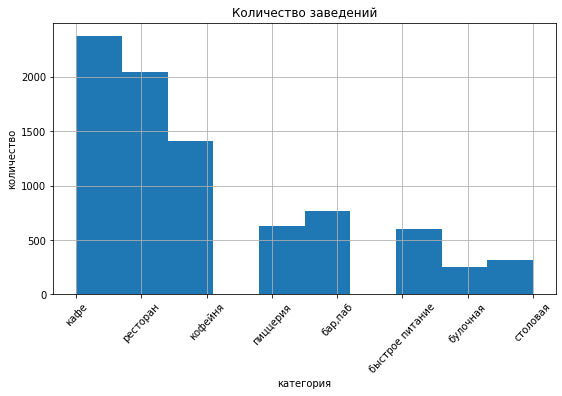

In [15]:
plt.figure(figsize =(9, 5)) 
data['category'].hist()
plt.xlabel('категория')
plt.ylabel('количество')
plt.title('Количество заведений')
plt.xticks(rotation=47)
plt.show()

Количество посадочных мест в заведениях общепита
<a id="seats"></a>

In [16]:
seats_by_cat = data.pivot_table(index='category', values='seats', aggfunc={'median'}) 

seats_by_cat = seats_by_cat.sort_values(by='median', ascending=False) 
seats_by_cat.reset_index(inplace= True , level = ['category'])
seats_by_cat

,category,median
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


Я визуализировал количество посадочных мест в заведениях общепита. Как видно, больше всего посадочных мест в ресторанах и барах. Меньше всего в пиццериях и булочных  
<a id="seatsvisual"></a>

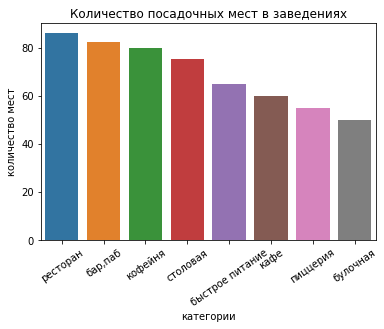

In [17]:
ax = sns.barplot(x= 'category', y='median', data=seats_by_cat);
sns.set (rc={'figure.figsize':( 25 , 10 )}) 
ax.set (xlabel='категории', ylabel='количество мест', title = 'Количество посадочных мест в заведениях');
ax.set_xticklabels(ax.get_xticklabels(),rotation = 35);



Я рассмотрел и соотнес количество сетевых и несетевых заведений. Как видно несетевых заведений - 5201, а сетевых - 3205. Это же можно увидеть и на графике
<a id="webandnotweb"></a> 

In [18]:
data['chain'].value_counts()

0    5201
1    3205
Name: chain, dtype: int64

In [19]:
chain = data.pivot_table(index='chain', values='address', aggfunc={'count'}) 
chain.reset_index(inplace= True , level = ['chain'])
chain['chain'] = chain['chain'].map({0:'несетевое', 1:'сетевое'})
chain

,chain,count
0,несетевое,5201
1,сетевое,3205


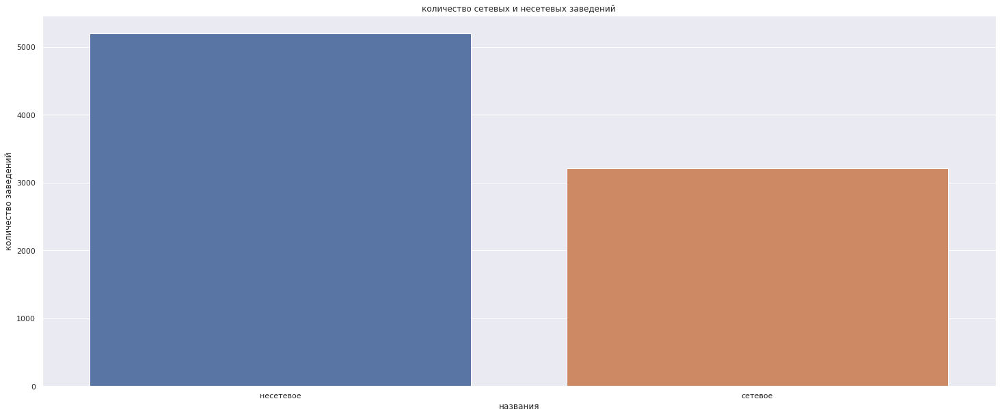

In [20]:
ax = sns.barplot(x= 'chain', y='count', data=chain);
sns.set (rc={'figure.figsize':( 25 , 6 )}) 
ax.set (xlabel='названия', ylabel='количество заведений', title= 'количество сетевых и несетевых заведений');
ax.set_xticklabels(ax.get_xticklabels(),rotation = 0);

In [21]:
not_web = data.query('chain == 0')
web = data.query('chain == 1')
not_web = not_web.pivot_table(index='category', values='chain', aggfunc={'count'}) 
web_by_cat = web.pivot_table(index='category', values='chain', aggfunc={'count'}) 
not_web.reset_index(inplace= True , level = ['category'])
web_by_cat.reset_index(inplace= True , level = ['category'])


In [22]:
not_web = not_web.sort_values(by= 'count', ascending=False) 
not_web.columns = ['category', 'несетевое заведение']

In [23]:
not_web 

,category,несетевое заведение
3,кафе,1599
6,ресторан,1313
4,кофейня,693
0,"бар,паб",596
2,быстрое питание,371
5,пиццерия,303
7,столовая,227
1,булочная,99


In [24]:
web_by_cat = web_by_cat.sort_values(by='count', ascending=False) 
web_by_cat.columns = ['category', 'сетевое заведение']

In [25]:
category_by_web = web_by_cat.merge(not_web, on=['category'])
category_by_web['общее количество'] = category_by_web['сетевое заведение'] + category_by_web['несетевое заведение']
category_by_web['соотношение сетевых заведений'] = category_by_web['сетевое заведение']/category_by_web['общее количество']
category_by_web['соотношение несетевых заведений'] = category_by_web['несетевое заведение']/category_by_web['общее количество']
category_by_web_final = category_by_web.drop(columns= ['сетевое заведение','несетевое заведение','общее количество'])
category_by_web_final = category_by_web_final.sort_values(by='соотношение несетевых заведений', ascending=False) 


Я выявил соотношение сетевых и несетевых заведений в во всех категориях. Больше всего сетевых заведений в кофейнях, пиццериях и булочных 

<a id="webandnotwebvisual"></a> 

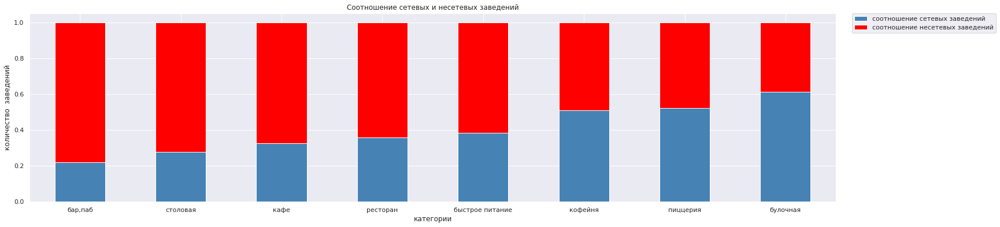

In [26]:
sns.set (rc={'figure.figsize':( 25 , 6 )}); 
ax = category_by_web_final.set_index('category').plot(kind='bar', stacked= True , color=['steelblue', 'red']);
ax.set (xlabel='категории', ylabel='количество  заведений', title = 'Соотношение сетевых и несетевых заведений');
ax.set_xticklabels(ax.get_xticklabels(),rotation = 0)
plt.legend(bbox_to_anchor=( 1.02 , 1 ), loc='upper left', borderaxespad= 0 );

Я выявил соотношение сетевых и несетевых заведений в во всех категориях. Больше всего сетевых заведений в кофейнях, пиццериях и булочных 
<a id="topweb"></a> 

In [27]:
web['city'] = web['address'].str.split(',').str[0].copy()
web = web.query('city == "Москва" ')
web_by_names = web.pivot_table(index='name', values='address', aggfunc={'nunique'}) 
web_by_names = web_by_names.sort_values(by='nunique', ascending=False) 
web_by_names = web_by_names.head(15)
web_by_names.reset_index(inplace= True , level = ['name'])
web_by_names

/tmp/ipykernel_48/3747126611.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  web['city'] = web['address'].str.split(',').str[0].copy()


,name,nunique
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


Я выпел топ-15 популярных сетей в Москве и посмотрел на их процентное соотношение. Как видно из графика, в процентном соотношении больше всего сетевых заведений у Шоколадницы и Домино Пицца
<a id="top15web"></a> 


In [28]:
fig = go.Figure(data=[go.Pie(labels=web_by_names['name'], values=web_by_names['nunique'], 
                             title='Топ 15 сетевых заведений')])
fig.show() 

Я выпел топ-15 популярных сетей в Москве и построил стобчатый график. Здесь так же видно, что больше всего заведений у Шоколадницы
<a id="top15webstolp"></a> 

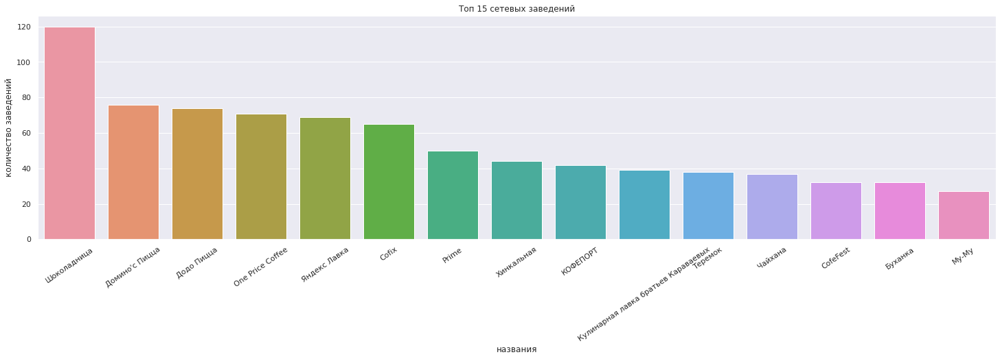

In [29]:
ax = sns.barplot(x= 'name', y='nunique', data=web_by_names);
sns.set (rc={'figure.figsize':( 25 , 6 )}) 
ax.set (xlabel='названия', ylabel='количество заведений', title= 'Топ 15 сетевых заведений');
ax.set_xticklabels(ax.get_xticklabels(),rotation = 35);

In [30]:
place_by_name = data.pivot_table(index=['district'], values='address', aggfunc={'nunique'}) 
place_by_name.reset_index(inplace= True , level = ['district'])
place_by_name.columns = ['district','count_by_add']
place_by_name.sort_values(by='count_by_add', ascending=False) 


,district,count_by_add
5,Центральный административный округ,1645
3,Северо-Восточный административный округ,604
2,Северный административный округ,601
8,Южный административный округ,600
0,Восточный административный округ,540
1,Западный административный округ,515
6,Юго-Восточный административный округ,504
7,Юго-Западный административный округ,450
4,Северо-Западный административный округ,294


In [31]:
place_by_category = data.pivot_table(index=['district', 'category'], values='address', aggfunc={'nunique'}) 
place_by_category.reset_index(inplace= True , level = ['district', 'category'])
place_by_category.columns = ['district','category', 'count_by_cat']
place_by_category.sort_values(by='count_by_cat', ascending=False) 

,district,category,count_by_cat
46,Центральный административный округ,ресторан,580
43,Центральный административный округ,кафе,412
44,Центральный административный округ,кофейня,389
40,Центральный административный округ,"бар,паб",332
27,Северо-Восточный административный округ,кафе,236
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",22
39,Северо-Западный административный округ,столовая,17
63,Юго-Западный административный округ,столовая,16
49,Юго-Восточный административный округ,булочная,12


In [32]:
place_merge = place_by_name.merge(place_by_category, on=['district'])
place_merge = place_merge.sort_values(by='count_by_add', ascending=False) 
place_merge

,district,count_by_add,category,count_by_cat
40,Центральный административный округ,1645,"бар,паб",332
47,Центральный административный округ,1645,столовая,63
41,Центральный административный округ,1645,булочная,49
42,Центральный административный округ,1645,быстрое питание,73
43,Центральный административный округ,1645,кафе,412
...,...,...,...,...
39,Северо-Западный административный округ,294,столовая,17
38,Северо-Западный административный округ,294,ресторан,92
37,Северо-Западный административный округ,294,пиццерия,39
33,Северо-Западный административный округ,294,булочная,12


Я оценил количество заведений и категорий по районам. Как видно  из графика, больше всего заведений в ЦАО. Меньше всего в СЗАО  
<a id="catbydistrct"></a> 

In [33]:
fig.update_layout(xaxis={'categoryorder': 'total ascending'})
fig = px.bar(place_merge, x='count_by_cat', y='district', color='category', orientation='h',
                labels={
                     'district': 'районы',
                     'count_by_cat': 'количество заведений',
                     'category': 'категории'
                 },
                title='Распределение заведений по районам и категориям')
fig.update_layout(xaxis={'categoryorder': 'total descending'})
fig.show();


In [34]:
cat_by_rating = data.pivot_table(index=['category'], values='rating') 
cat_by_rating.reset_index(inplace= True , level = ['category'])
cat_by_rating = cat_by_rating.sort_values(by='rating', ascending=False)
cat_by_rating

,category,rating
0,"бар,паб",4.387712
5,пиццерия,4.301264
6,ресторан,4.290357
4,кофейня,4.277282
1,булочная,4.268359
7,столовая,4.211429
3,кафе,4.123886
2,быстрое питание,4.050249


Я визуализировал рейтинги заведений общепита. Средний рейтинг примерно одинаковый у всех категорий общепита 
<a id="raitingeat"></a> 


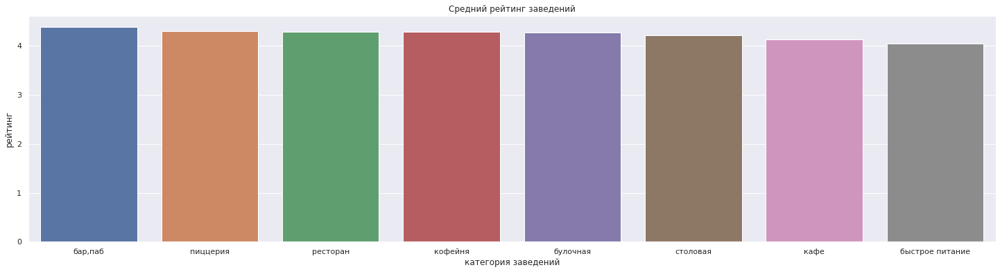

In [35]:
ax = sns.barplot(x= 'category', y='rating', data=cat_by_rating);
sns.set (rc={'figure.figsize':( 25 , 6 )}) 
ax.set (xlabel='категория заведений', ylabel='рейтинг', title= 'Средний рейтинг заведений');
ax.set_xticklabels(ax.get_xticklabels(),rotation = 0);

In [36]:
middle_rating_district = data.groupby('district', as_index=False)['rating'].agg('mean').round(2) 
middle_rating_district = middle_rating_district.sort_values(by='rating', ascending=False)
middle_rating_district

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
1,Западный административный округ,4.18
8,Южный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


Я построил фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Самый высокий рейтинг в у заведений в ЦАО
<a id="mapmeadleraiting"></a> 


In [37]:

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём к с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Я отобразил все заведения датасета на карте с помощью кластеров. Как и в прошлых графиках, здесь видно, что больше всего заведений с высоким средним рейтингом в ЦАО
<a id="mapclaster"></a> 


In [38]:
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

In [39]:
fig_data = data.pivot_table(
    index=['street'],
    values='name',
    aggfunc='count').sort_values('name', ascending=False).head(15)
fig_data.reset_index(inplace= True , level = ['street']) 
fig_data

,street,name
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [40]:
top = fig_data['street']
top_15_St = data.query('street in @top')
top_15_st = top_15_St.pivot_table(
    index=['street', 'category'],
    values='name',
    aggfunc='count')
top_15_st.reset_index(inplace= True , level = ['street','category']) 
top_15_st = top_15_st.sort_values(by='name', ascending=False) 
top_15_st

,street,category,name
93,проспект Мира,кафе,53
63,МКАД,кафе,45
96,проспект Мира,ресторан,45
94,проспект Мира,кофейня,36
70,Профсоюзная улица,кафе,35
...,...,...,...
58,Люблинская улица,пиццерия,1
83,проспект Вернадского,булочная,1
23,Кутузовский проспект,булочная,1
66,МКАД,столовая,1


In [41]:
top_15_st_merge = top_15_st.merge(fig_data, on=['street'])
top_15_st_merge = top_15_st_merge.sort_values(by='name_y', ascending=False) 
top_15_st_merge

,street,category,name_x,name_y
0,проспект Мира,кафе,53,184
2,проспект Мира,кофейня,36,184
3,проспект Мира,быстрое питание,21,184
4,проспект Мира,"бар,паб",12,184
5,проспект Мира,пиццерия,11,184
...,...,...,...,...
91,Пятницкая улица,кафе,7,48
95,Пятницкая улица,быстрое питание,2,48
93,Пятницкая улица,пиццерия,3,48
92,Пятницкая улица,кофейня,6,48


Я нашел топ-15 улиц по количеству заведений. Больше всего заведений находится Проспекте мира и Профсоюзной улице. Между прочим, Профсоюзная одна из самых длинных улиц в Москве 
<a id="top15streats"></a> 


In [42]:
fig = px.bar(top_15_st_merge, x='name_x', y='street', color='category', 
             labels={
                     'street': 'улицы',
                     'name_x': 'количество заведений',
                     'category': 'категории'
                 },
             title='Распределение заведений по 15 наиболее популярным улицам')
fig.update_xaxes(tickangle=45)
fig.show()

In [43]:
place_by_st = data.pivot_table(index='street', values='address', aggfunc={'count'})
place_by_st.reset_index(inplace= True , level = ['street'])
place_by_st.columns = ['street','count_by_st']


In [44]:
place_by_st_one = place_by_st.query('count_by_st == 1')
place_by_st_one

,street,count_by_st
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


Я нашел улицы, на которых находится только одно заведение и описал особенности этих заведений. Как видно из графиков, большинство подобных мест предлагает средние цены на еду. В большинстве из них около 80 посадочных мест. В заведениях с рейтингом от 4 до 4.5 посетителя потратят менее 1000 рублей на средний чек
<a id="cafebystreat"></a> 


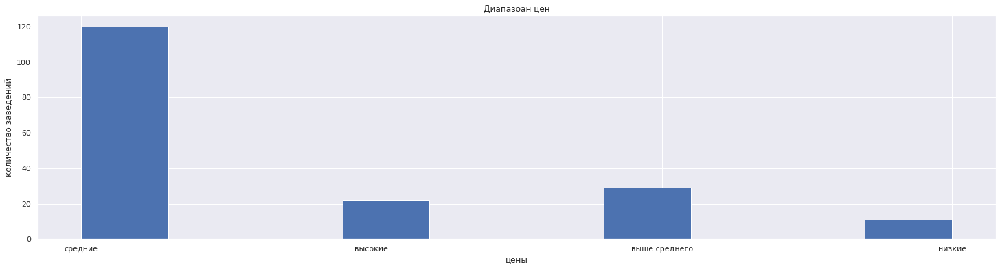

In [45]:
just_one = place_by_st_one.merge(data, how='left', on='street')
just_one = just_one.query('count_by_st == 1')
just_one['price'].hist();
plt.xlabel('цены');
plt.ylabel('количество заведений');
plt.title('Диапазоан цен');

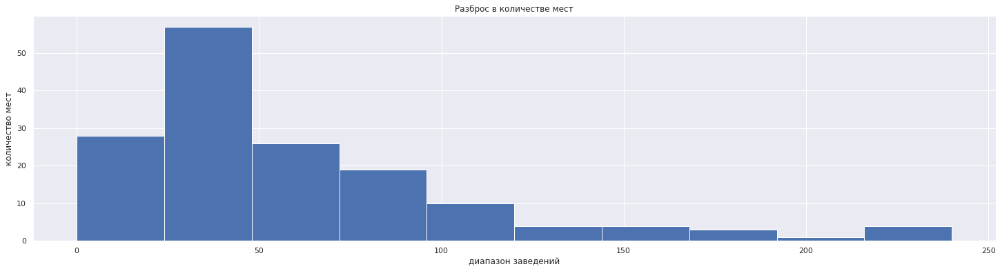

In [46]:
just_one['seats'].hist();
plt.xlabel('диапазон заведений');
plt.ylabel('количество мест');
plt.title('Разброс в количестве мест');

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


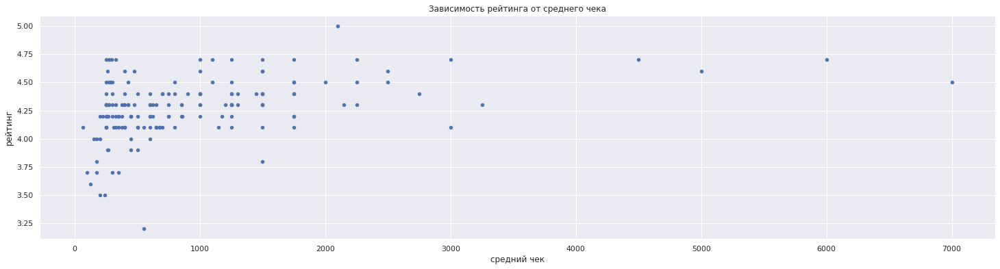

In [47]:
#sns.jointplot(x='middle_avg_bill', y='rating', data=just_one, kind='reg')

just_one.plot(x='middle_avg_bill', y = 'rating', kind = 'scatter', grid= True);
plt.xlabel('средний чек');
plt.ylabel('рейтинг');
plt.title('Зависимость рейтинга от среднего чека');


In [48]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [49]:
price_by_dist = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
price_by_dist

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Я посчитал медиану среднего чека для каждого района и отобразил данные на карте. Самый высокий средний чек в ЦАО и ЗАО. Ничего удивидельного это самые престижные районы Москвы 
<a id="medianbyavg"></a> 


In [50]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_by_dist,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медиана среднего чека в  заведениях по районам',
).add_to(m)

# выводим карту
m

Больше всего посадочных мест в ресторанах и барах. Меньше всего в булочных. Сетевых заведений почти вполовину меньше, чем несетевых. В процентном соотношении больше всего сетевых предприятий в пиццериях, кафе и булочных. Меньше всего - в барах, пабах и столовых. Больше всего заведений у шоколадницы и доминос пиццы. По районам и категориям больше всего заведений в ЦАО. Средний рейтинг всех заведений примерно одинаковый. Самый высокий средний рейтинг у заведений в ЦАО. Больше всего заведений располагается на Профсоюзной улице, Проспекте мира и Проспекте Верндаского. Я нашел улицы, на которых находится только одно заведение и описал особенности этих заведений. Как видно из графиков, большинство подобных мест предлагает средние цены на еду. В большинстве из них около 80 посадочных мест. В заведениях с рейтингом от 4 до 4.5 посетителя потратят менее 1000 рублей на средний чек. Самый высокий средний чек в ЦАО и ЗАО. Ничего удивидельного это самые престижные районы Москвы

Четвертая часть 
<a id="Forthpart"></a> 



In [51]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [52]:
places = data.pivot_table(index='category', values='address', aggfunc={'nunique'}) 
places.reset_index(inplace= True , level = ['category']) 
places.columns = ['category','nunique_place']
places_data = places.merge(data, how='left', on='category')
cafe_by_district = places_data.query('category == "кафе"')
cafe_by_district_ = cafe_by_district.pivot_table(index='district', values='nunique_place', aggfunc={'count'}) 
cafe_by_district_ = cafe_by_district_.sort_values(by= 'count', ascending=False)
cafe_by_district_.reset_index(inplace= True , level = ['district']) 
cafe_by_district_

,district,count
0,Центральный административный округ,464
1,Юго-Восточный административный округ,282
2,Восточный административный округ,272
3,Северо-Восточный административный округ,269
4,Южный административный округ,264
5,Западный административный округ,239
6,Юго-Западный административный округ,238
7,Северный административный округ,235
8,Северо-Западный административный округ,115


Больше всего кафе находится в ЦАО. Это же видно на графике. 
<a id="cafedata"></a> 


In [53]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

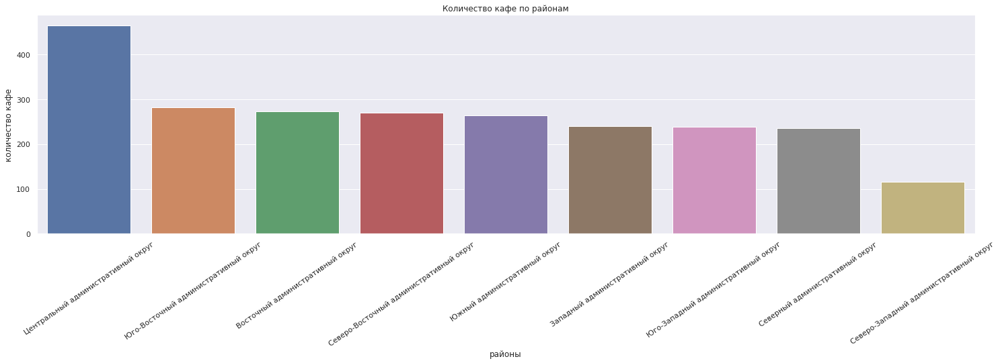

In [54]:
ax = sns.barplot(x= 'district', y='count', data=cafe_by_district_);
sns.set (rc={'figure.figsize':( 25 , 6 )}) 
ax.set (xlabel='районы', ylabel='количество кафе', title = 'Количество кафе по районам');
ax.set_xticklabels(ax.get_xticklabels(),rotation = 35);

In [55]:
data_cafe = places_data.query('category == "кофейня"') 
grouped_cafe = data_cafe.pivot_table(index='is_24', values='name', aggfunc={'count'})
grouped_cafe.reset_index(inplace= True , level = ['is_24']) 
grouped_cafe

grouped_cafe['is_24'] = grouped_cafe['is_24'].map({False:'некруглосуточные', True:'круглосуточные'})
grouped_cafe

,is_24,count
0,некруглосуточные,1339
1,круглосуточные,59


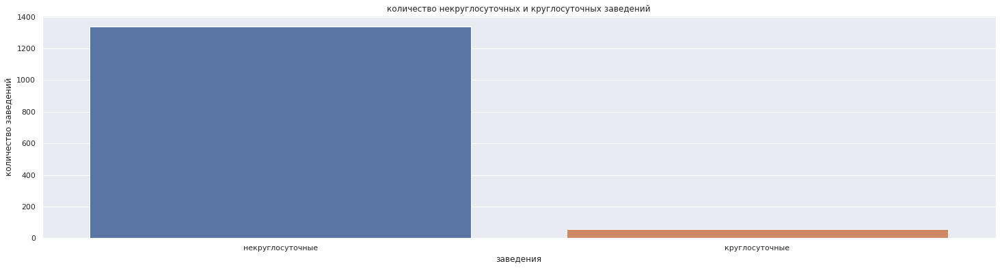

In [56]:
ax = sns.barplot(x= 'is_24', y='count', data=grouped_cafe);
sns.set (rc={'figure.figsize':( 25 , 6 )}) 
ax.set (xlabel='заведения', ylabel='количество заведений', title= 'количество некруглосуточных и круглосуточных заведений');
ax.set_xticklabels(ax.get_xticklabels(),rotation = 0);

In [57]:
grouped_cafe['count'].loc[0]

1339

In [58]:
grouped_cafe['count'].loc[1]

59

Я нашел круглосуточные кафе. Всего их 59. Я также отразил соотношение некруглосуточных и круглосуточных кафе на графике
<a id="cafefulltime"></a> 


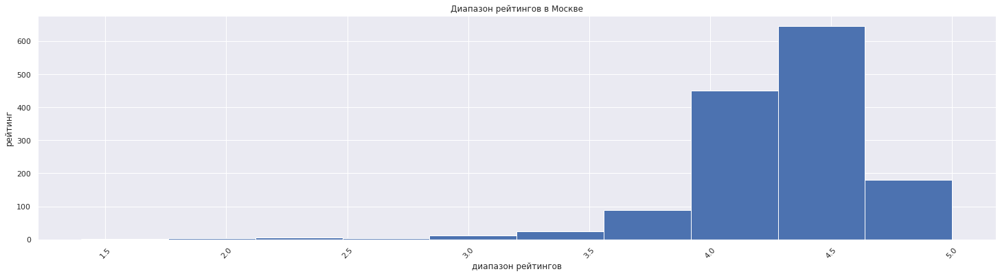

In [59]:
data_cafe['rating'].hist();
plt.xlabel('диапазон рейтингов')
plt.ylabel('рейтинг')
plt.title('Диапазон рейтингов в Москве')
plt.xticks(rotation=47)
plt.show()


In [60]:
cafe_rating_district =  cafe_by_district.pivot_table(index='district', values='rating') 
cafe_rating_district = cafe_rating_district.sort_values(by= 'rating', ascending=False)
cafe_rating_district.reset_index(inplace= True , level = ['district']) 
cafe_rating_district

,district,rating
0,Центральный административный округ,4.302371
1,Северный административный округ,4.180851
2,Восточный административный округ,4.098162
3,Южный административный округ,4.093939
4,Западный административный округ,4.075732
5,Северо-Восточный административный округ,4.053532
6,Юго-Восточный административный округ,4.047872
7,Северо-Западный административный округ,4.047826
8,Юго-Западный административный округ,4.036975


In [61]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cafe_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Рейтинг кафе по районам',
).add_to(m)

# выводим карту
m

In [62]:
kapuchino =  data.pivot_table(index='district', values='middle_coffee_cup') 
kapuchino.reset_index(inplace= True , level = ['district']) 
kapuchino.sort_values(by= 'middle_coffee_cup', ascending=False)

,district,middle_coffee_cup
1,Западный административный округ,189.640000
5,Центральный административный округ,188.210843
7,Юго-Западный административный округ,183.485714
0,Восточный административный округ,174.023810
3,Северо-Восточный административный округ,165.333333
2,Северный административный округ,165.090909
4,Северо-Западный административный округ,160.458333
8,Южный административный округ,157.826087
6,Юго-Восточный административный округ,150.771429


Я выявил примерную стоимость капучино, на которую нужно ориентироваться при открытии кафе. Она составляет - 165 рублей. По поему мнению, чтобы привлечь новых клиентов владельцам нужно снизить цену до 145 рублей. Как видно на карте, самый дорогой капучино продается в ЦАО, ЗАО и ЮЗАО. На мой взгляд лучше всего кофейню открывать в ЗАО, поскольку там меньше всего кофеин из районов с самым дорогим кофе, а это значит еще есть возможность найти свою нишу 
<a id="meadlcup"></a> 

In [63]:
kapuchino.median()

middle_coffee_cup    165.333333
dtype: float64

In [64]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=kapuchino,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Среднее цена капучино по районам',
).add_to(m)

# выводим карту
m

Рекомендации. На мой взгляд, лучше всего запустить кофейню в ЗАО, поскольку там один из самых высоких средних чеков и при не так много кафе, а это значит и конкуренция ниже. При открытии можно продавать кофе за 145 рублей - это дешевле, чем у всех остальных конкурентов, а значит можно привлечь новых клиентов. В среднем у кафеин в Москве достаточно высокий рейтинг, но именно в ЗАО он ниже 4. Таким образом, при оказании хороших услуг, возможно получить хорошие прибыли

Выводы.
1. Как показало иссдевание в Москве находится более 2000 кафе. На втором месте по числу заведений - рестораны, на третьем - кафейни.
2. Больше всего посадочных мест в ресторанах, барах и кафе.
3. Среди заведений преобладают несетевые заведения. В соотношении несетевых ресторанов и кафе больше, чем сетевых. 
4. Примерное равное число сетевых и несетевых заведений у кафеинь.Больше всего сетевых заведений в кофейнях, пиццериях и булочных 
5. Среди сетевый заведений больше всего кафе у Шоколадницы и Димино пиццы.
6. Больше всего заведений и по общему количеству, и по категориям в ЦАО. Средний рейтинг у всех заведений примерно одинаковый. 7. Самые высорейтинговые заведения находятся в ЦАО. 
8. Больше всего заведений находится Проспекте мира, Профсоюзной улице, Проспекте Вернадского.
9. Я нашел улицы, на которых находится только одно заведение и описал особенности этих заведений. Как видно из графиков, большинство подобных мест предлагает средние цены на еду. В большинстве из них около 80 посадочных мест. В заведениях с рейтингом от 4 до 4.5 посетителя потратят менее 1000 рублей на средний чек.
10. Больше всего кафе с рейтингом 4.5. 
11. Я нашел круглосуточные кафе. Всего их 59 
12. На карте Москвы видно, что в ЦАО сосредоточенно абсолютное большинство кафе с высоким рейтингом. 
13. Я выявил примерную стоимость капучино, на которую нужно ориентироваться при открытии кафе. Она составляет - 165 рублей. По поему мнению, чтобы привлечь новых клиентов владельцам нужно снизить цену до 145 рублей. Как видно на карте, самый дорогой капучино продается в ЦАО, ЗАО и ЮЗАО.
14. На мой взгляд, лучше всего запустить кофейню в ЗАО, поскольку там один из самых высоких средних чеков и при не так много кафе, а это значит и конкуренция ниже. При открытии можно продавать кофе за 145 рублей - это дешевле, чем у всех остальных конкурентов, а значит можно привлечь новых клиентов. В среднем у кафеин в Москве достаточно высокий рейтинг, но именно в ЗАО он ниже. Таким образом, при оказании хороших услуг, возможно получить хорошие прибыли
<a id="results"></a> 

Презентация: <https://disk.yandex.ru/d/zVyut4LiGIjlAQ> 
<a id="presentation"></a> 

Почему в курсе нигде не объяснили как сохранять презентацию в формате PDF? В юпитере этого нельзя сделать